# Pandas projekt
## Zadání:
V Edinburghu, stejně jako v dalších městech, funguje systém "bike sharing" - ve městě jsou stanice s koly, člověk si může nějaké půjčit a potom ho vrátit v nějaké další stanici. Problém je, že v některých stanicích se kola pravidelně hromadí a jinde naopak chybí. Provozovatel kol, firma Just Eat Cycles, zadala projekt, jehož cílem je systém zefektivnit. Výstup projektu je otevřený: může to být plán dodávek převážejících kola mezi stanicemi nebo návrh nové cenotvorby.
Coby datový analytik jste součástí týmu, který na projektu pracuje. Vaším úkolem je zpracovat relevantní data a zjistit z nich informace užitečné pro zbytek týmu. Máte k dispozici data o všech výpůjčkách (na ENGETO databázi v tabulce edinburgh_bikes). Proveďte standardní deskriptivní statistiku dat. Také zjistěte minimálně následující informace:
- identifikujte aktivní a neaktivní stanice
- identifikujte nejfrekventovanější stanice
- identifikujte stanice, na kterých se kola hromadí a stanice, kde potenciálně chybí
- spočítejte vzdálenosti mezi jednotlivými stanicemi
- jak dlouho trvá jedna výpůjčka? Najděte odlehlé hodnoty, zobrazte histogram
### Analýza poptávky:
- zobrazte vývoj poptávky po půjčování kol v čase
- identifikujte příčiny výkyvů poptávky
- zjistěte vliv počasí na poptávku po kolech (údaje o počasí v Edinburghu jsou v tabulce edinburgh_weather)
- půjčují si lidé kola více o víkendu než během pracovního týdne?

In [1]:
import numpy as np
import pandas as pd
import datetime as dt
from sklearn.linear_model import LogisticRegression
import sqlalchemy
import matplotlib.pyplot as plt
student_conn_string = "mysql+pymysql://student:p7@vw7MCatmnKjy7@data.engeto.com/data"
alchemy_conn = sqlalchemy.create_engine(student_conn_string)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 200)
pd.set_option('display.width', 500)
pd.set_option("display.precision", 2)
pd.options.display.float_format = '{:.2f}'.format

In [2]:
rides_df = pd.read_sql("select * from edinburgh_bikes", alchemy_conn, index_col="index")
rides_df["time"] = np.nan
rides_df["time"] = np.where(((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) >= "00:00:00") & ((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) <= "02:59:59"), "00:00", rides_df["time"])
rides_df["time"] = np.where(((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) >= "03:00:00") & ((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) <= "05:59:59"), "03:00", rides_df["time"])
rides_df["time"] = np.where(((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) >= "06:00:00") & ((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) <= "08:59:59"), "06:00", rides_df["time"])
rides_df["time"] = np.where(((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) >= "09:00:00") & ((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) <= "11:59:59"), "09:00", rides_df["time"])
rides_df["time"] = np.where(((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) >= "12:00:00") & ((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) <= "14:59:59"), "12:00", rides_df["time"])
rides_df["time"] = np.where(((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) >= "15:00:00") & ((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) <= "17:59:59"), "15:00", rides_df["time"])
rides_df["time"] = np.where(((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) >= "18:00:00") & ((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) <= "20:59:59"), "18:00", rides_df["time"])
rides_df["time"] = np.where(((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) >= "21:00:00") & ((rides_df["started_at"] - rides_df["started_at"].dt.normalize()) <= "23:59:59"), "21:00", rides_df["time"])
rides_df.started_at, rides_df.ended_at = rides_df.started_at.dt.normalize(), rides_df.ended_at.dt.normalize()

In [3]:
rides_df.head(2)

,started_at,ended_at,duration,start_station_id,start_station_name,start_station_description,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_description,end_station_latitude,end_station_longitude,time
index,,,,,,,,,,,,,,
0,2018-09-15,2018-09-15,1182,247,Charlotte Square,North Corner of Charlotte Square,55.95,-3.21,259,St Andrew Square,North East corner,55.95,-3.19,06:00
1,2018-09-15,2018-09-15,995,259,St Andrew Square,North East corner,55.95,-3.19,262,Canonmills,near Tesco's,55.96,-3.20,09:00


In [4]:
rides_df.shape

(340986, 14)

In [5]:
rides_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 340986 entries, 0 to 19378
Data columns (total 14 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   started_at                 340986 non-null  datetime64[ns]
 1   ended_at                   340986 non-null  datetime64[ns]
 2   duration                   340986 non-null  int64         
 3   start_station_id           340986 non-null  int64         
 4   start_station_name         340986 non-null  object        
 5   start_station_description  338612 non-null  object        
 6   start_station_latitude     340986 non-null  float64       
 7   start_station_longitude    340986 non-null  float64       
 8   end_station_id             340986 non-null  int64         
 9   end_station_name           340986 non-null  object        
 10  end_station_description    338426 non-null  object        
 11  end_station_latitude       340986 non-null  float64  

In [6]:
rides_df[["duration", "start_station_latitude", "start_station_longitude", "end_station_latitude", "end_station_longitude"]].describe()

,duration,start_station_latitude,start_station_longitude,end_station_latitude,end_station_longitude
count,340986.00,340986.00,340986.00,340986.00,340986.00
mean,2061.25,55.95,-3.20,55.95,-3.20
std,8703.69,0.01,0.04,0.02,0.04
min,61.00,55.91,-3.41,53.40,-3.41
25%,620.00,55.94,-3.21,55.94,-3.21
50%,1147.00,55.95,-3.19,55.95,-3.19
75%,2512.00,55.96,-3.18,55.96,-3.18
max,1373043.00,55.99,-3.06,55.99,-2.99


Máme k dispozici údaje o 340.986 výpůjčkách sdílených kol. Nan hodnoty jsou jen ve sloupcích s popisem stanic.

### Identifikujte aktivní a neaktivní stanice
aktivita = půjčení + vrácení

In [7]:
stations_id = (rides_df["start_station_id"].append(rides_df["end_station_id"])).sort_values().unique()         # jedinečné ID pro počáteční a koncové stanice
stations_df = pd.DataFrame(index=stations_id)

stations_df["name"] = rides_df.groupby(by="start_station_id")[["start_station_name"]].first() 
stations_df.loc[stations_df["name"].isnull()] = rides_df.groupby(by="end_station_id")[["end_station_name"]].first() # doplnění jmen stanic pro stanice, ve kterých se kola pouze vracejí

stations_df["start"] = rides_df.groupby(by="start_station_id")[["start_station_id"]].count()
stations_df["end"] = rides_df.groupby(by="end_station_id")[["end_station_id"]].count()
stations_df.fillna(0, inplace=True)
stations_df["start"], stations_df["end"] =  stations_df["start"].astype(int), stations_df["end"].astype(int)
stations_df["start_and_end"] = (stations_df["start"] + stations_df["end"]).astype(int)

stations_df["is_active"] = np.where(stations_df["start_and_end"] < 100, False, True)  # 100 zvoleno fenestrální metodou, v našem vzorku cca 14 %

In [8]:
stations_df.head(2)

,name,start,end,start_and_end,is_active
171,George Square,5330,5302,10632,True
183,Waverley Bridge,6769,6654,13423,True


In [9]:
stations_df["start_and_end"].count()  # počet stanic:

200

In [10]:
round(((stations_df["start_and_end"] < 100).sum() / stations_df["start_and_end"].count()) * 100, 2) # kolik % stanic je neaktivních (pod 100 výpůjček neb vrácení):

14.0

In [11]:
stations_df.loc[~stations_df["is_active"]]   # Neaktivní stanice:

,name,start,end,start_and_end,is_active
241,Depot,2,3,5,False
242,Virtual Depot,0,2,2,False
267,Launch Day Event,45,49,94,False
280,Smarter Travel Station,0,3,3,False
297,Royal Infirmary,19,32,51,False
299,Depot Virtual,3,5,8,False
353,Gibson Terrace,42,41,83,False
365,Novotel,5,6,11,False
875,Corstorphine Road - Pinkhill,18,20,38,False
883,Queensferry Road,39,51,90,False


### Identifikujte nejfrekventovanější stanice

In [12]:
stations_df.sort_values(by="start_and_end", ascending=False).head(5) # prvních 5 nejfrekventovanějších stanic:

,name,start,end,start_and_end,is_active
265,Meadows East,12715,11371,24086,True
250,Victoria Quay,8140,11479,19619,True
1728,Portobello - Kings Road,8036,10091,18127,True
248,Bristo Square,10999,6672,17671,True
259,St Andrew Square,10372,6943,17315,True


### Identifikujte stanice, na kterých se kola hromadí a stanice, kde potenciálně chybí

In [13]:
stations_df["balance"] = stations_df["end"] - stations_df["start"]
stations_df.sort_values(by="balance", ascending=False).head(5) # Stanice kde se kola nejvíce hromadí - pozitivní saldo:

,name,start,end,start_and_end,is_active,balance
250,Victoria Quay,8140,11479,19619,True,3339
358,Leith Walk,6554,9326,15880,True,2772
1824,Duke Street,5617,7961,13578,True,2344
1728,Portobello - Kings Road,8036,10091,18127,True,2055
262,Canonmills,7589,9482,17071,True,1893


In [14]:
stations_df.sort_values(by="balance", ascending=True).head(5) # Stanice kde se kola nejvíce půjčují - negativní saldo:

,name,start,end,start_and_end,is_active,balance
248,Bristo Square,10999,6672,17671,True,-4327
259,St Andrew Square,10372,6943,17315,True,-3429
247,Charlotte Square,6834,4248,11082,True,-2586
189,City Chambers,4605,2223,6828,True,-2382
260,Lauriston Place,5218,3014,8232,True,-2204


### Spočítejte vzdálenosti mezi jednotlivými stanicemi

- doplnění údajů o zeměpisné šířce a délce do dataframe stations

In [15]:
tmp_df = pd.DataFrame(index=stations_id)
tmp_df["latitude"] = rides_df.groupby(by="start_station_id")[["start_station_latitude"]].mean()                                                                      # průměr pro drobné odchylky v údajích zeměpisné délky a šířky
tmp_df.loc[tmp_df["latitude"].isnull()] = rides_df.groupby(by="end_station_id")[["end_station_latitude"]].mean().rename(columns={'end_station_latitude':'latitude'}) # doplnění pro stanice, ve kterých se kola pouze vracejí
stations_df["latitude"] = tmp_df["latitude"]
tmp_df["longitude"] = rides_df.groupby(by="start_station_id")[["start_station_longitude"]].mean()                                                                          
tmp_df.loc[tmp_df["longitude"].isnull()] = rides_df.groupby(by="end_station_id")[["end_station_longitude"]].mean().rename(columns={'end_station_longitude':'longitude'})   
stations_df["longitude"] = tmp_df["longitude"]
tmp_df = [0,0]  # vymazání dočasné df

- výpočet vzdáleností mezi stanicemi v metrech: 
$\sqrt{(\frac{2 * \pi * 6378137 * (latitude2 - latitude1)}{360})^2 + (\frac{2 * \pi * 6378137 * (longitude2 - longitude1)}{360})^2}$


In [16]:
latitude, longitude = stations_df.columns.get_loc('latitude'), stations_df.columns.get_loc('longitude')
last_column = stations_df.shape[1]
for col in range(len(stations_df)): 
    stations_df[stations_df.index[col]] = -1        # np.NaN vnáží do vlastností sloupce datový typ float         
    lat2, lon2 = stations_df.iloc[col, [latitude,longitude]]
    for row in range(len(stations_df)):
        if row >= col :                             # počítám pouze první část vzdáleností - je to rychlejší - neduplikuji výpočty 
            lat1, lon1 = stations_df.iloc[row, [latitude,longitude]]
            distance = round(np.sqrt(np.square((lat2 - lat1) * 2 * np.pi * 6378137 / 360) + np.square((lon2 - lon1) * 2 * np.pi * 6378137 / 360)))
            stations_df.iloc[row, col + last_column] = distance.astype(int)

In [17]:
stations_df.head() # vydálenosti mezi stanicemi v metrech 

,name,start,end,start_and_end,is_active,balance,latitude,longitude,171,183,189,225,241,242,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,264,265,266,267,273,275,277,280,284,285,289,290,296,297,299,340,341,342,343,344,345,346,347,349,350,351,352,353,354,355,356,357,358,359,365,366,648,820,860,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,887,888,889,890,891,901,...,1019,1024,1025,1026,1027,1028,1030,1031,1032,1033,1038,1039,1040,1041,1042,1050,1051,1052,1055,1056,1057,1090,1091,1092,1093,1094,1095,1096,1097,1098,1102,1720,1721,1722,1723,1724,1725,1726,1727,1728,1729,1730,1731,1737,1738,1739,1740,1743,1744,1745,1746,1747,1748,1749,1752,1753,1754,1756,1757,1758,1763,1764,1765,1766,1767,1768,1769,1770,1798,1799,1800,1807,1808,1809,1813,1814,1815,1818,1819,1820,1821,1822,1823,1824,1857,1859,1860,1864,1865,1866,1868,1869,1870,1871,1874,1877,2259,2263,2265,2268
171,George Square,5330,5302,10632,True,-28,55.94,-3.19,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
183,Waverley Bridge,6769,6654,13423,True,-115,55.95,-3.19,1015,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
189,City Chambers,4605,2223,6828,True,-2382,55.95,-3.19,812,223,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
225,Waverley Court,2114,1990,4104,True,-124,55.95,-3.18,1067,827,701,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
241,Depot,2,3,5,False,1,55.97,-3.16,4868,4605,4564,3903,0,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,

- jak dlouho trvá jedna výpůjčka? Najděte odlehlé hodnoty, zobrazte histogram

In [18]:
rides_df[["duration"]].describe()

,duration
count,340986.00
mean,2061.25
std,8703.69
min,61.00
25%,620.00
50%,1147.00
75%,2512.00
max,1373043.00


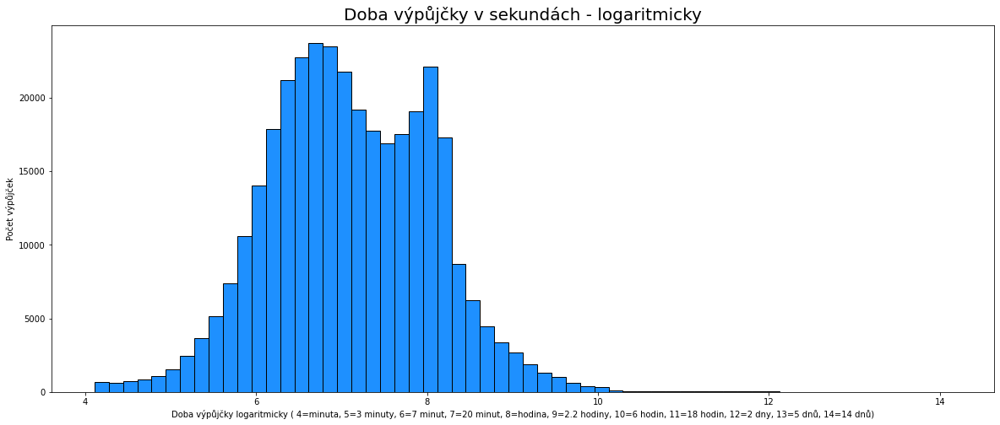

In [19]:
var = rides_df["duration"]
fig, axes = plt.subplots(figsize=(20,8))
hist_kwargs = {'bins': 60, 'edgecolor': 'black', "color": "DodgerBlue"}
axes.hist(np.log(var), **hist_kwargs)
axes.set_title("Doba výpůjčky v sekundách - logaritmicky", fontsize=20)
axes.set_xlabel("Doba výpůjčky logaritmicky ( 4=minuta, 5=3 minuty, 6=7 minut, 7=20 minut, 8=hodina, 9=2.2 hodiny, 10=6 hodin, 11=18 hodin, 12=2 dny, 13=5 dnů, 14=14 dnů)")
axes.set_ylabel("Počet výpůjček")
plt.show()

Nejkratší výpůjčka je 61 sekund, nejdelší 1373043 sekund (cca 15 dní). Nejvíce kol je vráceno do 1,5 hodiny (75%). Výpůjčky nad 6 hodin jsou výjimečné.

## Analýza poptávky:
### zobrazte vývoj poptávky po půjčování kol v čase

In [76]:
demand_df = pd.DataFrame(index=rides_df["started_at"].unique())
demand_df["rents"] = rides_df.groupby("started_at").count()[["duration"]]
demand_df["rents_rolling_mean"] = demand_df["rents"].rolling(29, center=True, min_periods=0).mean()
demand_df["rents_spike"] = np.where(((demand_df["rents"] / demand_df["rents_rolling_mean"]) > 2) | ((demand_df["rents"] / demand_df["rents_rolling_mean"]) < 0.1) , True, False)
demand_df["day_of_week"] = demand_df.index.to_series().dt.dayofweek.values
demand_df["day_name"] = demand_df.index.to_series().dt.day_name(locale="Czech").values
demand_df["month_number"] = demand_df.index.month
demand_df["month_name"] = demand_df.index.to_series().dt.month_name(locale="Czech").values
demand_df["isweekend"] = np.where((demand_df["day_of_week"] == 5) | (demand_df["day_of_week"] == 6), True, False)  
demand_df.index.set_names(['date', ], inplace=True)
demand_df.describe()

,rents,rents_rolling_mean,day_of_week,month_number
count,755.00,755.00,755.00,755.00
mean,451.64,451.75,3.01,6.70
std,340.18,287.65,2.00,3.43
min,3.00,119.07,0.00,1.00
25%,196.50,224.84,1.00,4.00
50%,364.00,377.69,3.00,7.00
75%,577.50,570.36,5.00,10.00
max,2428.00,1147.45,6.00,12.00


### Úprava souboru s počasím:
pro každý den vypočítáme průměrný stav ukazatelů temp, feels, wind, gust, rain, cloud, pressure a vis.\
Parametr vis nabývá hodnot ['Poor', 'Average', 'Good', 'Excellent'], které nahradím [0, 0.33, 0.66, 0.99].

In [77]:
weather_df = pd.read_sql("select * from edinburgh_weather", alchemy_conn, index_col="date")
weather_df.vis = weather_df.vis.str.replace("Poor", "0")
weather_df.vis = weather_df.vis.str.replace("Average", "0.33")
weather_df.vis = weather_df.vis.str.replace("Good", "0.66")
weather_df.vis = weather_df.vis.str.replace("Excellent", "0.99").astype(float)
for column in ['temp', 'feels', 'wind', 'gust', 'rain', 'humidity', 'cloud', 'pressure']:
    weather_df.loc[:, column] = weather_df.loc[:, column].str.replace("[^0-9.]", "", regex=True).astype(float)
weather_df.index = pd.to_datetime(weather_df.index)      # pro datovou kompatibilitu se stejným indexem v df demand_df 
demand_df = demand_df.join(weather_df.groupby("date").agg( {'temp': "mean", 'feels': "mean", 'wind': "mean", 'gust': "mean", 'rain': "sum", 'humidity': "mean", 'cloud': "mean", 'pressure': "mean", 'vis': "mean"}))
demand_df.head(2)

,rents,rents_rolling_mean,rents_spike,day_of_week,day_name,month_number,month_name,isweekend,temp,feels,wind,gust,rain,humidity,cloud,pressure,vis
date,,,,,,,,,,,,,,,,,
2018-09-15,3,137.87,True,5,Sobota,9,Září,True,10.50,8.50,14.88,23.50,1.00,83.88,58.12,1017.38,0.99
2018-09-16,10,139.12,True,6,Neděle,9,Září,True,12.88,10.62,26.50,43.12,1.00,81.50,79.50,1008.88,0.99


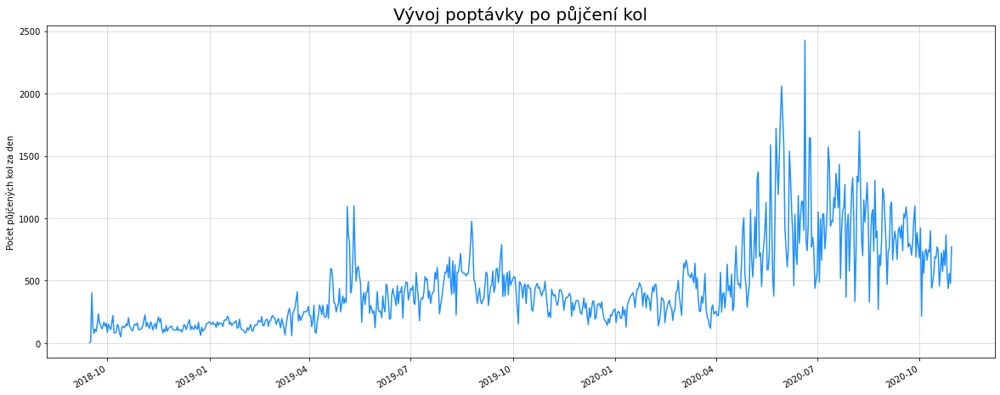

In [78]:
fig, ax = plt.subplots(figsize=(20,8))
demand_df["rents"].plot(linewidth=1.5, color="DodgerBlue")
ax.set_title("Vývoj poptávky po půjčení kol", fontsize=20)
ax.set_ylabel("Počet půjčených kol za den")
ax.set_xlabel("")
ax.grid(alpha=0.5)
plt.show()

### Identifikujte příčiny výkyvů poptávky

Z již zjištěných skutečností je možné vyčíst tyto vlivy:
- roční změny - během druhého roku je půjčeno více kol než v prvním roce (je otázkou, zda se zvýšil počet kol, nebo poptávka po nich)
- sezónní změny - během roku se poptávka po kolech zvyšuje až do letních prázdnin a pak se trend obrátí a poptávka po kolech se snižuje
- týdenní změny - v sobotu a v neděli se půjčí více kol než v pracovních dnech
- výkyvy (maxima) způsobené svátky :
 - 17.9.2018 Mid-term holidays
 - 5.5.2019 bank holiday
 - 11.5.2019 Spring Fair & Waldorf 100 Celebration
 - 20.6.2020 Edinburgh Pride, Royal Highland Show 2020 - zřízeny zvláštní stanice pro půjčení kol
- výkyvy způsobené počasím :
 - deštěm
 - teplotou
 - větrem

In [79]:
demand_df.loc[demand_df["rents_spike"]]

,rents,rents_rolling_mean,rents_spike,day_of_week,day_name,month_number,month_name,isweekend,temp,feels,wind,gust,rain,humidity,cloud,pressure,vis
date,,,,,,,,,,,,,,,,,
2018-09-15,3,137.87,True,5,Sobota,9,Září,True,10.50,8.50,14.88,23.50,1.00,83.88,58.12,1017.38,0.99
2018-09-16,10,139.12,True,6,Neděle,9,Září,True,12.88,10.62,26.50,43.12,1.00,81.50,79.50,1008.88,0.99
2018-09-17,403,135.88,True,0,Pondělí,9,Září,False,13.88,13.12,18.00,29.88,0.20,83.00,66.12,1006.38,0.99
2019-05-05,1096,502.31,True,6,Neděle,5,Květen,True,6.12,3.38,14.50,19.50,0.00,66.12,48.50,1025.25,0.99
2019-05-11,1102,491.62,True,5,Sobota,5,Květen,True,9.12,8.62,6.00,7.25,0.40,71.88,61.75,1020.75,0.99
2020-06-20,2428,987.72,True,5,Sobota,6,Červen,True,15.38,14.88,15.12,20.75,6.30,74.12,57.38,1012.62,0.95


### Půjčují si lidé kola více o víkendu než během pracovního týdne ?

In [83]:
demand_df.groupby("isweekend").mean()[["rents"]] # True == víkend, když uvažuji nad jedním dnem, půjčuje se více o víkendu:

,rents
isweekend,
False,437.15
True,487.55


In [84]:
demand_df.groupby("isweekend").sum()[["rents"]] # True == víkend, když uvažuji nad všemi dny , pak se v pracovních dnech půjčí celkem více kol:

,rents
isweekend,
False,235188
True,105798


In [85]:
demand_df[["day_of_week", "day_name","rents"]].groupby(by="day_name").mean().sort_values("day_of_week")[["rents"]]   # Průměrný počet výpůjček kol v jednotlivých dnech

,rents
day_name,
Pondělí,417.50
Úterý,422.68
Středa,436.74
Čtvrtek,454.02
Pátek,454.85
Sobota,507.71
Neděle,467.57


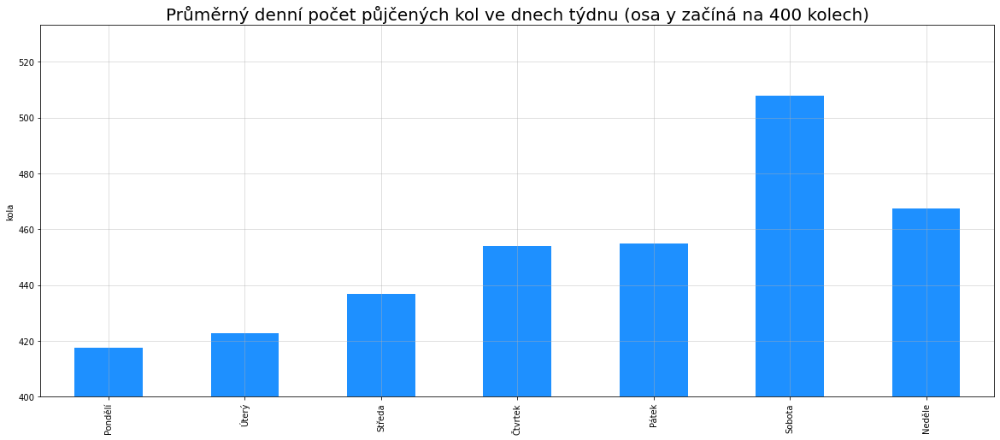

In [64]:
var = demand_df[["day_of_week", "day_name","rents"]].groupby(by="day_name").mean().sort_values("day_of_week")["rents"]
fig, ax = plt.subplots(figsize=(20,8))
var.plot(kind="bar", color="DodgerBlue")
ax.set_ylim(bottom=400)
ax.set_title("Průměrný denní počet půjčených kol ve dnech týdnu (osa y začíná na 400 kolech)", fontsize=20)
ax.set_ylabel("kola")
ax.set_xlabel("")
ax.grid(alpha=0.5)
plt.show()

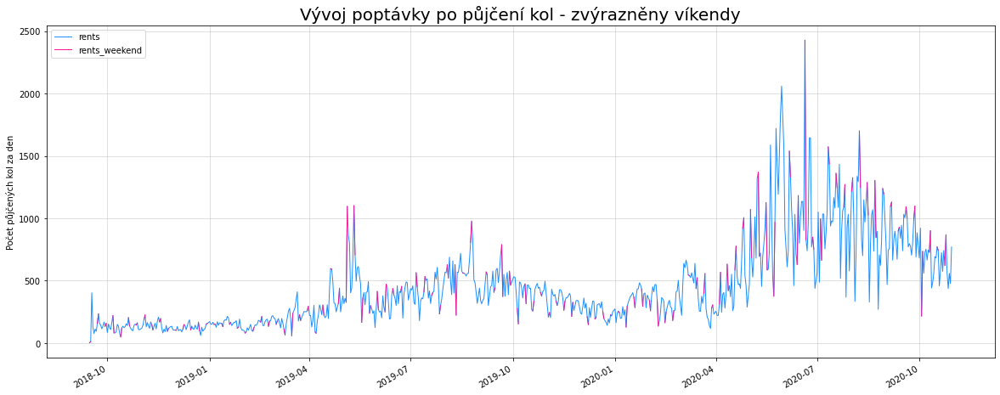

In [87]:
demand_df["rents_weekend"] = np.where(demand_df["isweekend"], demand_df["rents"], np.nan)
fig, ax = plt.subplots(figsize=(20,8))
demand_df["rents"].plot(ax=ax, linewidth=1.0, color="DodgerBlue")
demand_df["rents_weekend"].plot(ax=ax, linewidth=1.0, color="DeepPink")
ax.set_title("Vývoj poptávky po půjčení kol - zvýrazněny víkendy", fontsize=20)
ax.set_ylabel("Počet půjčených kol za den")
ax.set_xlabel("")
ax.legend(loc=2, ncol=1)
ax.grid(alpha=0.5)
plt.show()

### Vliv počasí na poptávku po kolech 

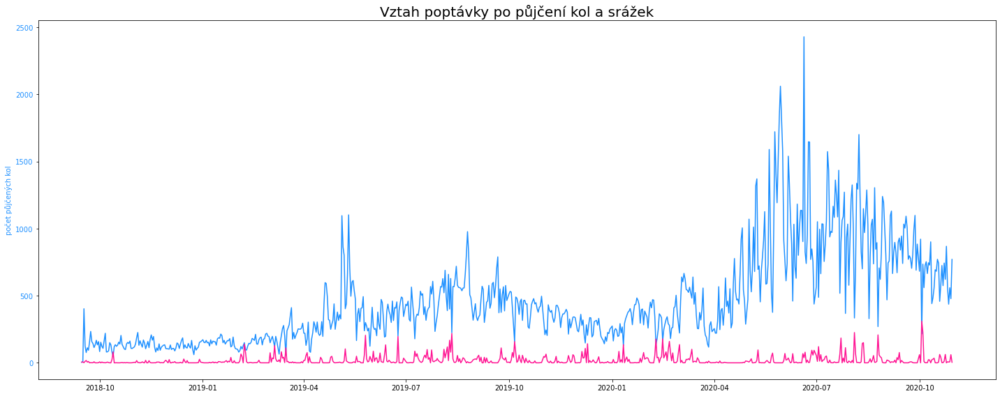

In [92]:
fig, ax1 = plt.subplots(figsize=(20,8))
ax1.set_title("Vztah poptávky po půjčení kol a srážek", fontsize=20)

color = "DodgerBlue"
ax1.set_xlabel('')
ax1.set_ylabel('počet půjčených kol', color=color)
ax1.plot(demand_df["rents"], color=color)
ax1.tick_params(axis='y', labelcolor=color)
color = 'DeepPink'
ax1.plot(demand_df["rain"] * 6 , color=color)   # zvýraznění v grafu
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

Mezi poptávkou po vypůjčení kol a množstvím srážek je negativní vazba. Ve dnech kdy hodně prší se půjčuje výrazně méně kol.\
Je to asi nevýznamnější ukazatel počasí. Spolu s teplotou, nárazovým větrem, viditelností a dalšími ukazately počasí ovlivňující poptávku po kolech.

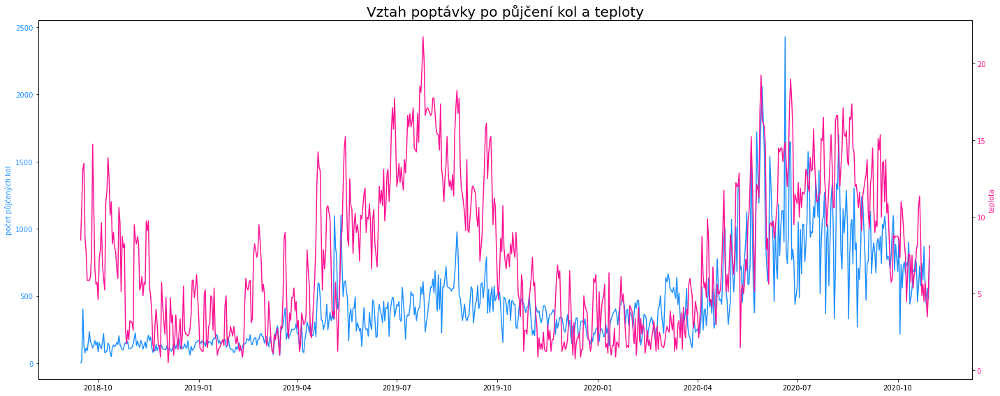

In [96]:
fig, ax1 = plt.subplots(figsize=(20,8))
ax1.set_title("Vztah poptávky po půjčení kol a teploty", fontsize=20)
color = "DodgerBlue"
ax1.set_xlabel('')
ax1.set_ylabel('počet půjčených kol', color=color)
ax1.plot(demand_df["rents"], color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'DeepPink'
ax2.set_ylabel('teplota', color=color)  
ax2.plot(demand_df["feels"], color=color)
ax2.tick_params(axis='y', labelcolor=color)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

Mezi poptávkou po vypůjčení kol a množstvím pocitovou teplotou je pozitivní vazba. Ve dnech kdy je teplota vyšší se půjčuje více kol.

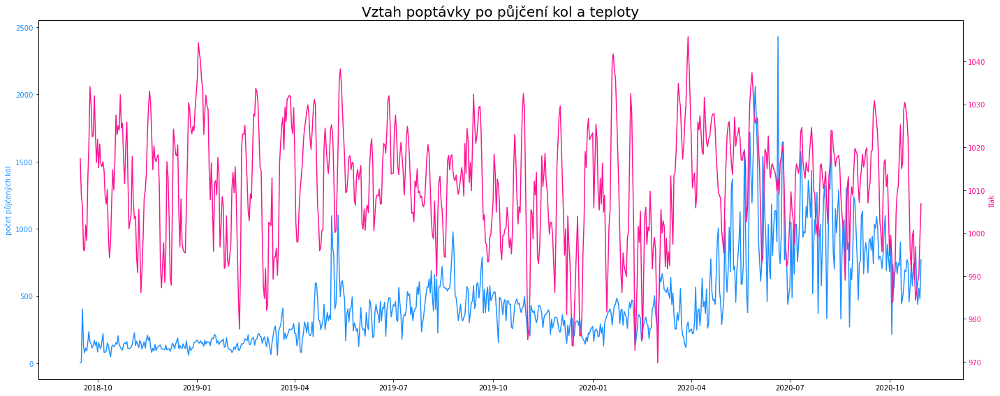

In [108]:
fig, ax1 = plt.subplots(figsize=(20,8))
ax1.set_title("Vztah poptávky po půjčení kol a teploty", fontsize=20)
color = "DodgerBlue"
ax1.set_xlabel('')
ax1.set_ylabel('počet půjčených kol', color=color)
ax1.plot(demand_df["rents"], color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'DeepPink'
ax2.set_ylabel('tlak', color=color)  
ax2.plot(demand_df["pressure"], color=color)
ax2.tick_params(axis='y', labelcolor=color)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

## Stanice v Edinburgu - výstup z jiného projektu

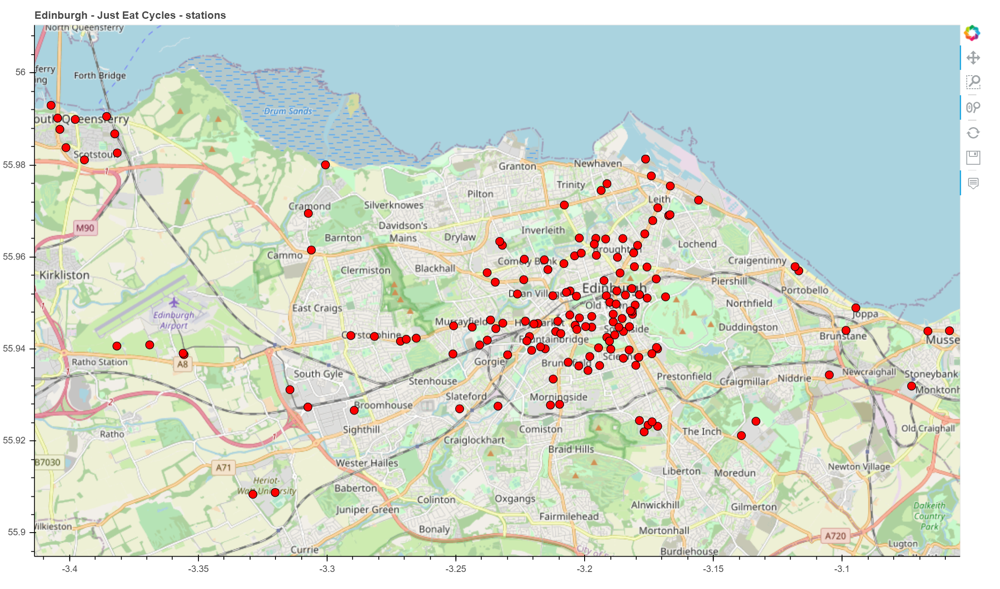

## Stanice v Edinburgu - využití stanic 1.9.2019  (červená = kola chybí; modrá = kola se hromadí)

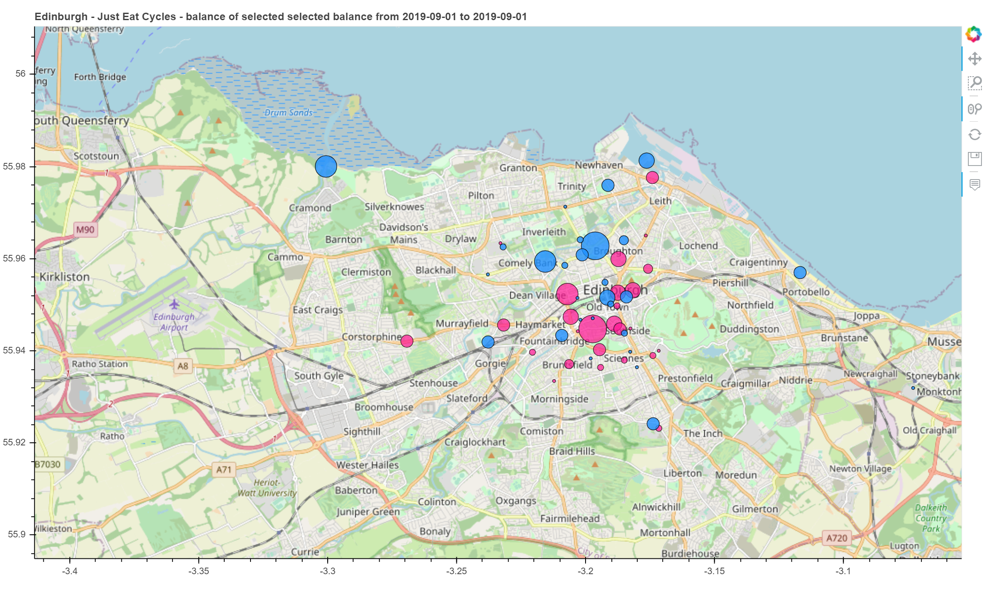